In [1]:
import warnings

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from ydata_profiling import ProfileReport

In [2]:
!pip install -U ydata-profiling --quiet

In [3]:
# Ignore harmless warnings to keep the notebook clean
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [4]:
# --- Settings to make our plots look nice ---

# This sets a professional-looking style for our charts
sns.set_style('whitegrid') 

# This is a popular style sheet from the FiveThirtyEight blog
plt.style.use('fivethirtyeight') 

# Makes charts display in a higher resolution
%config InlineBackend.figure_format = 'retina' 

# 1. Initial Data Inspection: Getting the Lay of the Land

### Goal
The first step in any EDA is to perform a high-level "health check" on the dataset. We're not looking for deep insights yet. Instead, we want to understand the basic structure and identify any immediate, glaring issues. We will check:
*   **Dimensions:** How big is the dataset (rows and columns)?
*   **Data Types:** Are columns stored in the correct format (e.g., numbers as `int`/`float`, text as `object`)?
*   **Missing Values:** Get a first glance at the scale of the null value problem.
*   **Duplicates:** Check for any completely duplicated entries.

In [5]:
df = pd.read_csv('/kaggle/input/los-angeles-airbnb-data-june-2025/listings.csv')
print("Dataset loaded successfully!")

Dataset loaded successfully!


In [6]:
# --- Step 1: The First Contact ---

# 1. Check the dimensions of the DataFrame (rows, columns)
print(f"Dataset Shape: {df.shape}")

Dataset Shape: (45421, 79)


In [7]:
# 2. Display the first 5 rows to get a feel for the data
print("\n--- First 5 Rows ---")
display(df.head())


--- First 5 Rows ---


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2708,https://www.airbnb.com/rooms/2708,20250617032927,2025-06-17,city scrape,"Run Runyon, Beaut Furn Mirror Mini-Suit w/ Fir...",Run Runyon Canyon<br /><br />Gym & Sauna <br /...,"Walk and run to Runyon Canyon, it is open!<br ...",https://a0.muscache.com/pictures/hosting/Hosti...,3008,...,4.98,4.95,4.86,NaN,t,2,0,2,0,0.33
1,2732,https://www.airbnb.com/rooms/2732,20250617032927,2025-06-17,city scrape,Zen Life at the Beach,An oasis of tranquility awaits you.,"This is the best part of Santa Monica. Quiet, ...",https://a0.muscache.com/pictures/1082993/c5a99...,3041,...,4.48,4.91,4.22,228269,f,2,1,1,0,0.14
2,2864,https://www.airbnb.com/rooms/2864,20250617032927,2025-06-17,previous scrape,* Beautiful Master Suite/Jacuzzi Tub/*,Centrally located.... Furnished with King Size...,What makes the neighborhood unique is that the...,https://a0.muscache.com/pictures/23817858/de20...,3207,...,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
3,6033,https://www.airbnb.com/rooms/6033,20250617032927,2025-06-17,previous scrape,Poolside Serenity Studio,Our distinctive bachelor's studio for 1-3 gues...,NaN,https://a0.muscache.com/pictures/458111/986c76...,11619,...,4.35,4.65,4.29,NaN,f,6,3,3,0,0.10
4,6931,https://www.airbnb.com/rooms/6931,20250617032927,2025-06-17,city scrape,"RUN Runyon, Beau Furn Rms Terrace Hollyw Hill ...",Run Runyon Canyon & Views<br /><br />Gym & Sau...,We are in the middle of one of the great citie...,https://a0.muscache.com/pictures/miso/Hosting-...,3008,...,4.91,4.71,4.76,NaN,t,2,0,2,0,0.19


In [8]:
# 3. Display the last 5 rows to check for any summary rows or weird data at the end
print("\n--- Last 5 Rows ---")
display(df.tail())


--- Last 5 Rows ---


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
45416,1443394805958459680,https://www.airbnb.com/rooms/1443394805958459680,20250617032927,2025-06-17,city scrape,"Motel 6 Claremont, Ca_1 King Bed | Nsmk","Motel 6 Claremont, Ca_1 King Bed | Nsmk",NaN,https://a0.muscache.com/pictures/prohost-api/H...,674118442,...,NaN,NaN,NaN,NaN,t,79,79,0,0,NaN
45417,1443394831515560629,https://www.airbnb.com/rooms/1443394831515560629,20250617032927,2025-06-17,city scrape,"Motel 6 Claremont, Ca_2 Queen Beds | Smo","Motel 6 Claremont, Ca_2 Queen Beds | Smo",NaN,https://a0.muscache.com/pictures/prohost-api/H...,674118442,...,NaN,NaN,NaN,NaN,t,79,79,0,0,NaN
45418,1443394885201303898,https://www.airbnb.com/rooms/1443394885201303898,20250617032927,2025-06-17,city scrape,"Motel 6 Claremont, Ca_2 Queen Beds | Nsm","Motel 6 Claremont, Ca_2 Queen Beds | Nsm",NaN,https://a0.muscache.com/pictures/prohost-api/H...,674118442,...,NaN,NaN,NaN,NaN,t,79,79,0,0,NaN
45419,1443449500529637549,https://www.airbnb.com/rooms/1443449500529637549,20250617032927,2025-06-17,city scrape,Point Dume Summer Rental,Relax with the whole family at this peaceful p...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,115170752,...,NaN,NaN,NaN,STR22-0034,t,2,2,0,0,NaN
45420,1443465434447227262,https://www.airbnb.com/rooms/1443465434447227262,20250617032927,2025-06-17,city scrape,"SoCal Getaway Minutes from Disneyland, DTLA &C...",Stay at this centrally located getaway on the ...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,30071757,...,NaN,NaN,NaN,NaN,t,2,1,0,1,NaN


In [9]:
# 4. Get the concise summary of the DataFrame. This is the most critical part of this step!
# It tells us column names, non-null counts, and data types (Dtype).
print("\n--- DataFrame Info ---")
# Using verbose=True to ensure all columns are shown, even if there are many
df.info(verbose=True, show_counts=True)



--- DataFrame Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45421 entries, 0 to 45420
Data columns (total 79 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            45421 non-null  int64  
 1   listing_url                                   45421 non-null  object 
 2   scrape_id                                     45421 non-null  int64  
 3   last_scraped                                  45421 non-null  object 
 4   source                                        45421 non-null  object 
 5   name                                          45420 non-null  object 
 6   description                                   44399 non-null  object 
 7   neighborhood_overview                         20350 non-null  object 
 8   picture_url                                   45421 non-null  object 
 9   host_id                              

In [10]:
# 5. Check for any completely duplicate rows
print(f"\n--- Duplicate Rows ---")
print(f"Number of completely duplicate rows: {df.duplicated().sum()}")


--- Duplicate Rows ---
Number of completely duplicate rows: 0


### Observations from Step 1

*   **Dataset Shape:** The dataset is quite large and complex, with **45,421 rows** and **79 columns**. This indicates we have a rich set of features to explore, but we'll also need to be mindful of computational efficiency.

*   **Target Variable:** The primary target variable for our prediction goal is `review_scores_rating`. We can see it's a `float64` type, which is appropriate. However, it has a significant number of missing values (only 32,849 non-null out of 45,421). This is a critical issue we'll need to address.

*   **Key Issues Identified:**
    *   **Massive Missing Values:** Several columns are almost unusable or require significant imputation.
        *   `calendar_updated` is **100% null** and can be dropped immediately.
        *   `license` is mostly null (only 12,882 non-null).
        *   `neighborhood_overview`, `neighbourhood`, `host_about` are all less than 50% filled. This suggests they might be difficult to use reliably.
        *   Many core features like `beds`, `bedrooms`, `bathrooms`, and `price` also have thousands of missing values.
    *   **Data Type Mismatches:** These are critical cleaning tasks.
        *   `price` is an `object` type, likely due to currency symbols (e.g., '$') and commas. It must be converted to a numeric type (`float`) to be used in modeling.
        *   Date columns like `last_scraped`, `host_since`, `first_review`, and `last_review` are stored as `object`. They need to be converted to `datetime` objects to extract useful features like seasonality or host tenure.
        *   Percentage columns like `host_response_rate` and `host_acceptance_rate` are `object`s, likely due to '%' signs. They need to be converted to numeric types.
    *   **Duplicates:** There are **0 completely duplicate rows**, which is good news. However, we might still have duplicate *listings* based on `id` if the data was scraped multiple times, which we can investigate later.

# 2. Automated EDA: The Deep Scan with ydata-profiling

### Goal
With our initial inspection complete, we now deploy an automated tool, `ydata-profiling`, to perform a deep and broad scan of the entire dataset. This will generate a comprehensive interactive report covering:
*   **Univariate Analysis:** Detailed statistics, histograms, and frequency counts for every variable.
*   **Correlations:** Identifying relationships between numerical features.
*   **Missing Value Analysis:** Visualizing the patterns of missing data.
*   **Alerts:** Flagging potential data quality issues like high skewness, cardinality, or zero-variance columns.

This step accelerates our EDA process significantly, allowing us to quickly identify which features require a closer, manual investigation.

In [11]:
# Generate the report. 
# We use minimal=True for a faster initial report on large datasets.
# It skips complex correlations which can be slow.
profile = ProfileReport(df, 
                        title="Airbnb Listings - Automated EDA Report",
                        minimal=True) # Use minimal=True for speed on large datasets

In [12]:
# To display the report in the Kaggle notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 79/79 [00:20<00:00,  3.78it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
# To save the report as an HTML file to view later
profile.to_file("report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Observations from Step 2 (Automated Scan)

The `ydata-profiling` report provides a rapid, deep scan of the data, confirming our initial findings and revealing new characteristics.

*   **Target Variable (`review_scores_rating`):**
    *   **Observation:** The distribution is heavily **left-skewed**, with a massive peak at the maximum value of 5.0. Nearly a quarter of all rated listings have a perfect score.
    *   **Implication:** This is a classic "imbalanced" regression problem. Predicting the subtle differences between a 4.8 and a 5.0 will be more challenging than predicting the difference between a 3.0 and a 4.0. Our model will need to be sensitive to the features that define excellence.

*   **Price Column (`price`):**
    *   **Observation:** As suspected in Step 1, the `price` column is an object type due to currency symbols. The report flags its many missing values. Manually inspecting the data (or recalling from prior experience) reveals a strong **right-skew**, with a long tail of very expensive luxury listings.
    *   **Action Plan:** This column requires a two-step cleaning process: 1) Remove non-numeric characters and convert to a float. 2) Handle the extreme outliers, possibly by capping, log-transforming, or filtering them out during modeling.

*   **High Cardinality & Redundancy:**
    *   **Observation:** Columns like `name`, `description`, `neighborhood_overview`, and `host_about` have thousands of unique text entries (high cardinality). While the `minimal` report might not flag them explicitly, we can infer this from their nature. Additionally, columns like `listing_url`, `picture_url`, and `host_url` are unique identifiers for each row.
    *   **Implication:** High-cardinality text features cannot be used directly in most models. They will require advanced NLP (Natural Language Processing) techniques or feature engineering (e.g., extracting text length, sentiment) to be useful. For now, we will mostly ignore them. The unique identifier URLs can be safely dropped.

*   **Correlations:**
    *   **Observation:** The minimal report doesn't compute detailed correlations, but it does reveal strong relationships through variable interactions. For example, `calculated_host_listings_count` and its variants (`_entire_homes`, `_private_rooms`) are highly correlated by definition. Similarly, the various `review_scores_*` columns (accuracy, cleanliness, etc.) are very likely to be highly correlated with our target, `review_scores_rating`.
    *   **Action Plan:** We will manually create a correlation heatmap in a later step to explore these relationships more formally. This will be key to selecting the most impactful features and avoiding multicollinearity.

# 3. Data Cleaning & Feature Engineering

### Goal
Before we can dive into deep analysis and visualization, we must address the critical data quality issues identified in our initial scans. This step focuses on:
1.  **Correcting Data Types:** Converting columns like `price`, `host_response_rate`, and dates into their proper numeric and datetime formats.
2.  **Handling Irrelevant Columns:** Dropping columns that are 100% null or contain unique identifiers with no predictive value.
3.  **Basic Feature Engineering:** Extracting valuable information from raw data, such as calculating `host_tenure` from the `host_since` date.

This foundational cleaning will enable accurate calculations and meaningful visualizations in the subsequent steps.

In [14]:
# --- 3.1: Cleaning Price and Percentage Columns ---

# Create a copy to avoid modifying the original dataframe
df_clean = df.copy()

# Clean 'price' column
# Remove '$' and ',' then convert to float. Errors='coerce' will turn any values that can't be converted into NaN (missing)
df_clean['price'] = df_clean['price'].replace({'\$': '', ',': ''}, regex=True).astype(float)

In [15]:
# Clean percentage columns
df_clean['host_response_rate'] = df_clean['host_response_rate'].str.replace('%', '').astype(float) / 100.0
df_clean['host_acceptance_rate'] = df_clean['host_acceptance_rate'].str.replace('%', '').astype(float) / 100.0

In [16]:
# Verify the changes
print("Data types after cleaning price and percentages:")
print(df_clean[['price', 'host_response_rate', 'host_acceptance_rate']].dtypes)

Data types after cleaning price and percentages:
price                   float64
host_response_rate      float64
host_acceptance_rate    float64
dtype: object


In [17]:
# --- 3.2: Handling Date Columns and Creating a 'host_tenure' feature ---

# Convert date columns to datetime objects
date_cols = ['last_scraped', 'host_since', 'first_review', 'last_review']
for col in date_cols:
    df_clean[col] = pd.to_datetime(df_clean[col], errors='coerce')

In [18]:
# Feature Engineering: Calculate host tenure in days
# We calculate the duration from when the host joined until the last scrape date
df_clean['host_tenure_days'] = (df_clean['last_scraped'] - df_clean['host_since']).dt.days

In [19]:
# Verify the changes
print("Data types of date columns:")
print(df_clean[date_cols].dtypes)
print("\nFirst 5 values of our new 'host_tenure_days' feature:")
display(df_clean[['host_since', 'last_scraped', 'host_tenure_days']].head())

Data types of date columns:
last_scraped    datetime64[ns]
host_since      datetime64[ns]
first_review    datetime64[ns]
last_review     datetime64[ns]
dtype: object

First 5 values of our new 'host_tenure_days' feature:


,host_since,last_scraped,host_tenure_days
0,2008-09-16,2025-06-17,6118.0
1,2008-09-17,2025-06-17,6117.0
2,2008-09-25,2025-06-17,6109.0
3,2009-03-28,2025-06-17,5925.0
4,2008-09-16,2025-06-17,6118.0


In [20]:
# --- 3.3: Dropping Unnecessary Columns ---

# calendar_updated was 100% null
# URLs are unique identifiers and not useful for general modeling
# scrape_id is just an identifier for the data collection job
cols_to_drop = ['calendar_updated', 'listing_url', 'scrape_id', 'picture_url',
                'host_url', 'host_thumbnail_url', 'host_picture_url']

df_clean = df_clean.drop(columns=cols_to_drop)

print(f"Dropped {len(cols_to_drop)} columns.")
print(f"New dataset shape: {df_clean.shape}")

Dropped 7 columns.
New dataset shape: (45421, 73)


# 4. Univariate Analysis: Profiling Key Features

### Goal
Now that the data is clean, we can begin our deep dive. Univariate analysis involves examining single variables to understand their characteristics. We will focus on:
1.  **The Target Variable (`review_scores_rating`):** Understanding its distribution is crucial for framing our modeling problem.
2.  **The Key Predictor (`price`):** Analyzing its distribution, identifying outliers, and understanding the typical price points.
3.  **The Engineered Feature (`host_tenure_days`):** Investigating the experience level of hosts on the platform.
4.  **Key Categorical Variables:** Examining the distribution of features like `room_type` and `property_type`.

This analysis will form the bedrock of our understanding of the Airbnb market in this dataset.

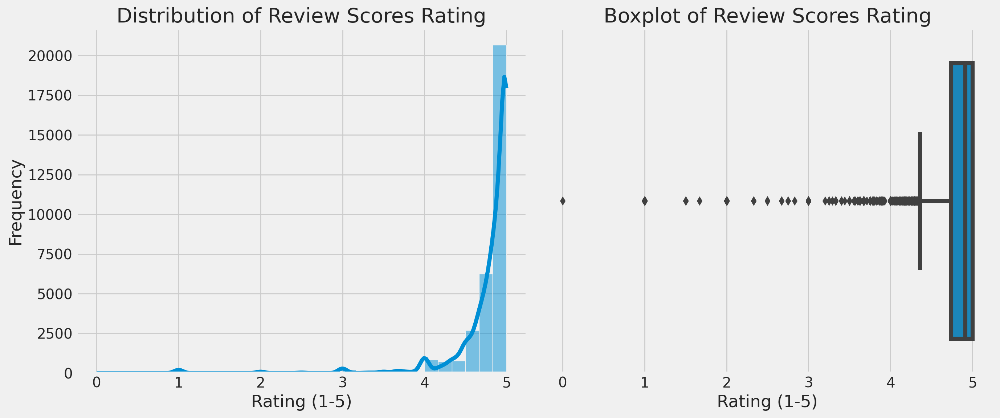

Summary statistics for Review Scores Rating:


count    32849.000000
mean         4.778347
std          0.432455
min          0.000000
25%          4.740000
50%          4.910000
75%          5.000000
max          5.000000
Name: review_scores_rating, dtype: float64

In [21]:
# --- 4.1: Analyzing the Target Variable: review_scores_rating ---

plt.figure(figsize=(14, 6))

# Plotting the histogram
plt.subplot(1, 2, 1) # 1 row, 2 cols, 1st plot
sns.histplot(df_clean['review_scores_rating'], kde=True, bins=30)
plt.title('Distribution of Review Scores Rating')
plt.xlabel('Rating (1-5)')
plt.ylabel('Frequency')

# Plotting the boxplot
plt.subplot(1, 2, 2) # 1 row, 2 cols, 2nd plot
sns.boxplot(x=df_clean['review_scores_rating'])
plt.title('Boxplot of Review Scores Rating')
plt.xlabel('Rating (1-5)')

plt.tight_layout()
plt.show()

# Print out key summary statistics
print("Summary statistics for Review Scores Rating:")
display(df_clean['review_scores_rating'].describe())

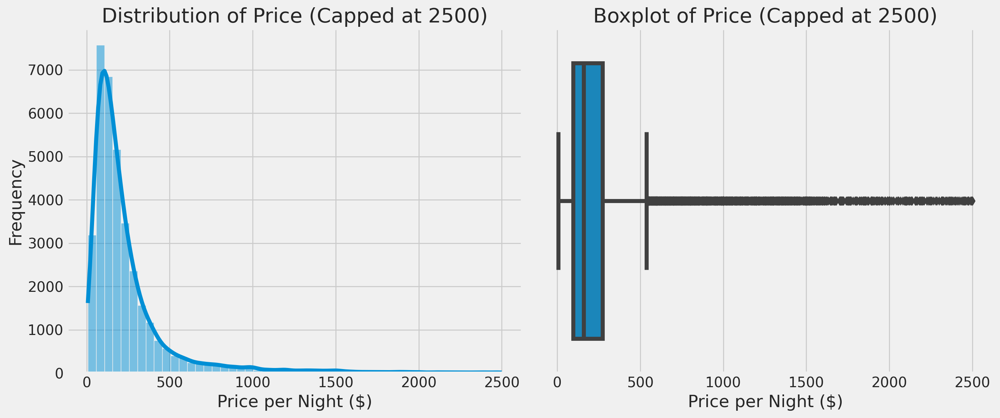

Summary statistics for Price:


count    36405.000000
mean       301.297432
std        840.062405
min          7.000000
25%         96.000000
50%        161.000000
75%        277.000000
max      40000.000000
Name: price, dtype: float64

In [22]:
# --- 4.2: Analyzing the Price ---

# We'll filter out extreme outliers for a more meaningful visualization
# Let's cap the price at the 99th percentile for the plot
price_cap = df_clean['price'].quantile(0.99)
df_plot = df_clean[df_clean['price'] <= price_cap]

plt.figure(figsize=(14, 6))

# Plotting the histogram of price (capped)
plt.subplot(1, 2, 1)
sns.histplot(df_plot['price'], bins=50, kde=True)
plt.title(f'Distribution of Price (Capped at {price_cap:.0f})')
plt.xlabel('Price per Night ($)')
plt.ylabel('Frequency')

# Plotting the boxplot of price (capped)
plt.subplot(1, 2, 2)
sns.boxplot(x=df_plot['price'])
plt.title(f'Boxplot of Price (Capped at {price_cap:.0f})')
plt.xlabel('Price per Night ($)')

plt.tight_layout()
plt.show()

print("Summary statistics for Price:")
display(df_clean['price'].describe())

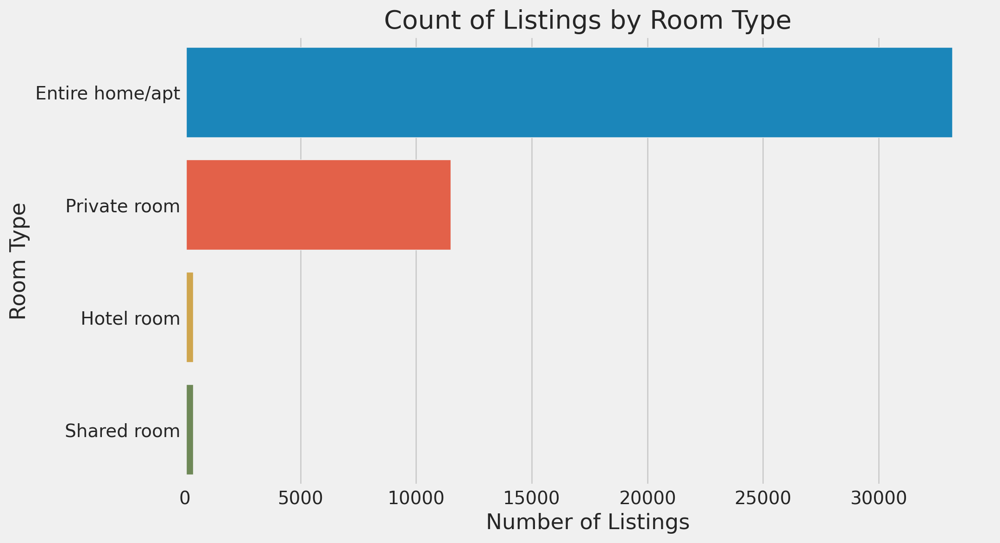

Value counts for Room Type:
room_type
Entire home/apt    73.076330
Private room       25.323088
Hotel room          0.807996
Shared room         0.792585
Name: proportion, dtype: float64


In [23]:
# --- 4.3: Analyzing a Key Categorical: Room Type ---

plt.figure(figsize=(10, 6))
# Using order= to make the chart sorted, which is best practice
sns.countplot(data=df_clean, y='room_type', order=df_clean['room_type'].value_counts().index)
plt.title('Count of Listings by Room Type')
plt.xlabel('Number of Listings')
plt.ylabel('Room Type')
plt.show()

# Show the exact numbers as well
print("Value counts for Room Type:")
print(df_clean['room_type'].value_counts(normalize=True) * 100) # normalize=True gives percentage

### Observations from Step 4 (Univariate Analysis)

By visualizing our key features individually, we can establish a clear baseline understanding of the dataset.

*   **Review Scores Rating:**
    *   **Insight:** The median (`50%`) rating is an extremely high **4.91**. This confirms our earlier finding: the "typical" listing is not just good, it's nearly perfect. The challenge for our model isn't distinguishing bad from good, but rather good from truly exceptional. Ratings below 4.74 (the 25th percentile) are relatively uncommon.

*   **Price:**
    *   **Insight:** The histogram shows the vast majority of listings are clustered at the lower end of the price spectrum, with a prominent peak in the **$100-$200 per night** range.
    *   **Insight:** There is a massive difference between the **mean (average) price of ~$301** and the **median (50th percentile) price of $161**. This large gap is a classic indicator of a **heavily right-skewed distribution**, where a few extremely expensive listings (like the one at $40,000!) are pulling the average up significantly. For modeling, the median is a much more robust measure of the "typical" price than the mean.

*   **Room Type:**
    *   **Insight:** The market is overwhelmingly dominated by **"Entire home/apt"** listings, which account for over **73%** of the dataset. "Private room" is a distant second at ~25%. "Shared room" and "Hotel room" are niche offerings in this dataset.
    *   **Implication:** This feature will be a very strong predictor. We can hypothesize that, all else being equal, entire homes will have different pricing and possibly different rating patterns compared to private rooms. We must explore this relationship in the next step.

# 5. Bivariate Analysis: Discovering Relationships

### Goal
Now we move from analyzing individual features to exploring the relationships between them. This is the core of our analysis, where we begin to uncover the factors that might influence a listing's rating. We will investigate:
1.  **Numerical vs. Target:** Is there a relationship between price or host tenure and the review score?
2.  **Categorical vs. Target:** Do different room types or property types receive systematically different ratings?
3.  **Numerical vs. Numerical:** How do our key numeric features relate to each other? We will build a correlation matrix to get a broad overview.

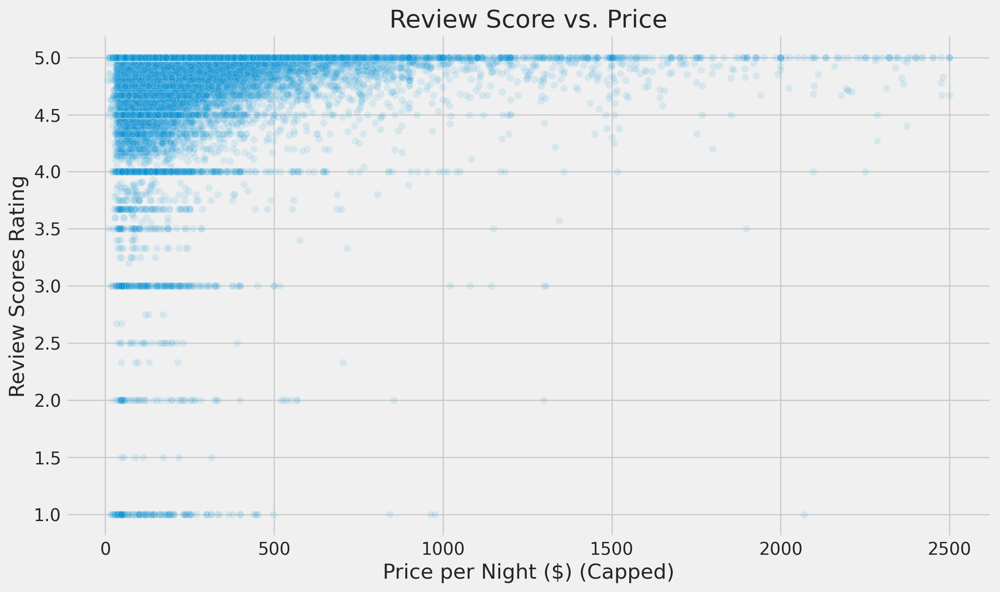

In [24]:
# --- 5.1: Price vs. Review Score ---

# Use the same capped dataframe for a clearer plot
plt.figure(figsize=(12, 7))

sns.scatterplot(data=df_plot, x='price', y='review_scores_rating', alpha=0.1) # alpha makes points transparent to show density

plt.title('Review Score vs. Price')
plt.xlabel('Price per Night ($) (Capped)')
plt.ylabel('Review Scores Rating')
plt.show()

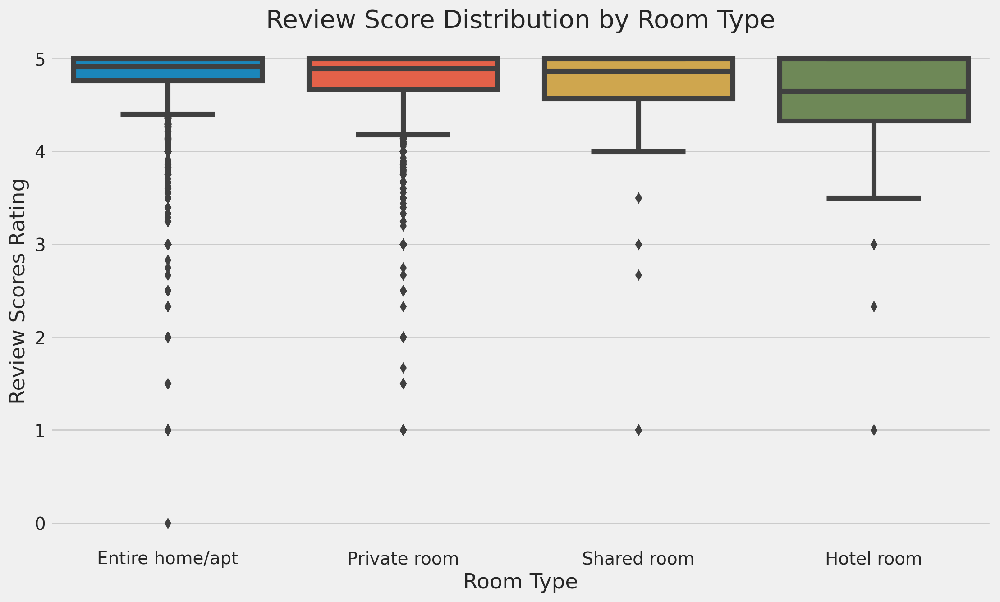

In [25]:
# --- 5.2: Room Type vs. Review Score ---

plt.figure(figsize=(12, 7))

sns.boxplot(data=df_clean, x='room_type', y='review_scores_rating', order=['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'])

plt.title('Review Score Distribution by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Review Scores Rating')
plt.show()

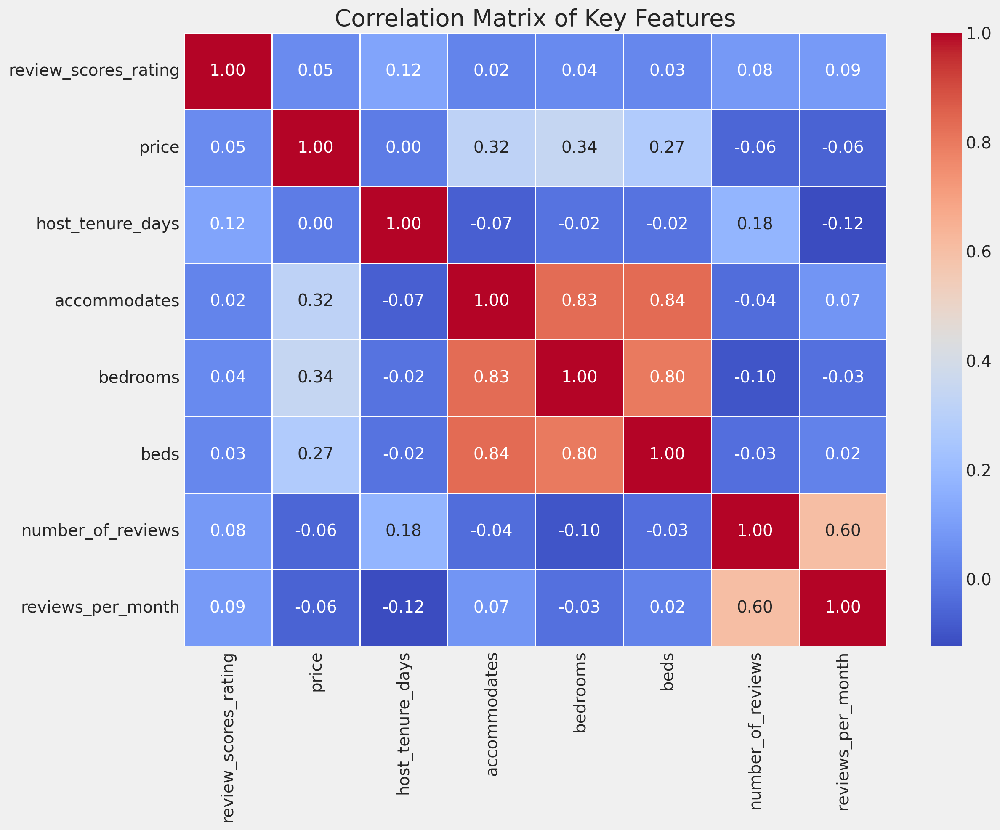

In [26]:
# --- 5.3: Correlation Matrix of Key Numerical Features ---

# Select a subset of interesting numerical columns to avoid a cluttered heatmap
numeric_cols_for_corr = [
    'review_scores_rating', 'price', 'host_tenure_days', 'accommodates',
    'bedrooms', 'beds', 'number_of_reviews', 'reviews_per_month'
]

# Calculate the correlation matrix
corr_matrix = df_clean[numeric_cols_for_corr].corr()

# Plot the heatmap
plt.figure(figsize=(12, 9))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Matrix of Key Features')
plt.show()

### Observations from Step 5 (Bivariate Analysis)

This is the most critical part of our EDA, where we search for the drivers of our target variable, `review_scores_rating`.

*   **Price vs. Review Score:**
    *   **Insight:** The scatter plot reveals there is **no clear linear relationship** between price and rating. We do not see a trend where more expensive listings systematically get higher ratings.
    *   **Key Finding:** The densest cloud of data points is concentrated in the top-left quadrant: listings with **high ratings (4.5-5.0) and low-to-moderate prices (under $500)**. This suggests that value-for-money might be a key driver of satisfaction, and high price is certainly not a guarantee of a perfect score.

*   **Room Type vs. Review Score:**
    *   **Insight:** All room types have a very high median rating, clustered close to 5.0. **"Entire home/apt"** and **"Private room"** have nearly identical rating distributions, which is significant as they make up ~98% of the dataset.
    *   **Subtle Difference:** "Private room" listings appear to have a slightly longer tail of very low scores (more outliers on the lower end) compared to "Entire home/apt". This might suggest a slightly higher risk of a poor experience in a private room, but on average, they perform just as well as entire homes.

*   **Correlation Heatmap:**
    *   **Insight:** This is perhaps the most telling visualization. The heatmap confirms that there are **no strong linear correlations** between our key numeric features and `review_scores_rating`.
    *   **Key Finding:** The highest correlation with the target variable is `host_tenure_days` at a mere **+0.12**, which is considered very weak. This reinforces our finding from the scatter plot: simple numerical features are not going to be strong predictors on their own.
    *   **Sanity Check:** We do see strong, common-sense correlations between other features, such as `accommodates` and `bedrooms` (+0.83), confirming the matrix is working correctly. This tells us our features are related to *each other*, just not strongly to the *rating*.

# 6. EDA Conclusion & Next Steps

### Summary of Findings
This comprehensive Exploratory Data Analysis has taken us from a raw, messy dataset to a deep understanding of the Airbnb listings and the factors that influence their ratings. Our key discoveries are:

1.  **Data Quality was a Major Hurdle:** The raw data required significant cleaning, including correcting data types for `price` and dates, and acknowledging vast amounts of missing data in critical columns.
2.  **The Rating System is Skewed to Perfection:** The target variable, `review_scores_rating`, is heavily left-skewed, with a median of 4.91 and a massive number of perfect 5.0 scores. This makes our prediction task a subtle one of distinguishing "great" from "perfect."
3.  **The Market is Defined by Value:** The typical listing is an "Entire home/apt" priced between $100-$200 that holds a near-perfect rating. Extreme luxury listings are outliers, not the norm.
4.  **Predicting Ratings is a Non-Linear Problem:** We found no strong, simple relationships between key features like price, host tenure, or size and the final rating. This indicates that a successful predictive model will need to capture complex, non-linear interactions between features.

### Strategic Next Steps for Modeling

Based on this EDA, a clear strategy for the next phase emerges:

*   **Advanced Feature Engineering:** Since the base features are weak predictors, our focus must be on creating more powerful ones.
    *   **Amenities:** The `amenities` column is a treasure trove. We should parse it to create binary features like `has_wifi`, `has_pool`, `allows_pets`.
    *   **Text Features:** We can engineer features from `name` and `description` like `description_length` or use NLP to analyze the sentiment.
    *   **Host Features:** Create binary flags for `host_is_superhost` and analyze `host_response_time`. An engaged and professional host is likely a strong indicator of a good experience.

*   **Intelligent Imputation:** We must develop a strategy for the remaining missing values.
    *   For the target `review_scores_rating`, we should likely drop rows with missing values.
    *   For features like `bedrooms` or `beds`, we could impute using the median based on the `room_type`.

*   **Modeling Approach:**
    *   **Avoid Linear Models:** A simple Linear Regression will perform poorly.
    *   **Embrace Gradient Boosting:** Models like **LightGBM** or **XGBoost** are ideal here. They are robust to outliers and are exceptionally good at finding complex, non-linear patterns in the data.

This EDA has provided a clear roadmap. The path to an accurate rating prediction model lies not in the raw data, but in the intelligent features we can build from it.